In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
country = pd.read_csv("Metadata_Country.csv")
population = pd.read_csv("country_population.csv")
fertility = pd.read_csv("fertility_rate.csv")
life_expectency = pd.read_csv("life_expectancy.csv")

In [5]:
life_expectency.isna().sum()

Country Name     0
Country Code     0
1960            29
1961            28
1962            28
1963            29
1964            29
1965            28
1966            28
1967            28
1968            28
1969            28
1970            27
1971            28
1972            28
1973            27
1974            28
1975            28
1976            28
1977            28
1978            26
1979            27
1980            25
1981            25
1982            22
1983            24
1984            24
1985            24
1986            23
1987            20
1988            23
1989            23
1990            21
1991            20
1992            20
1993            22
1994            20
1995            20
1996            21
1997            18
1998            21
1999            20
2000            17
2001            19
2002            16
2003            19
2004            19
2005            18
2006            18
2007            17
2008            17
2009            17
2010        

In [4]:
fertility.drop(['Indicator Name','Indicator Code'],axis = 1, inplace = True)
life_expectency.drop(['Indicator Name','Indicator Code'],axis = 1, inplace = True)
population.drop(['Indicator Name','Indicator Code'],axis = 1, inplace = True)

In [6]:
for year in range(1960, 2017):
    column_mean = life_expectency[str(year)].mean()
    life_expectency[str(year)] = life_expectency[str(year)].fillna(column_mean)
print(life_expectency)

     Country Name Country Code       1960       1961       1962       1963  \
0           Aruba          ABW  65.662000  66.074000  66.444000  66.787000   
1     Afghanistan          AFG  32.292000  32.742000  33.185000  33.624000   
2          Angola          AGO  33.251000  33.573000  33.914000  34.272000   
3         Albania          ALB  62.279000  63.298000  64.187000  64.911000   
4         Andorra          AND  53.367005  53.919724  54.313463  54.691397   
..            ...          ...        ...        ...        ...        ...   
259        Kosovo          XKX  53.367005  53.919724  54.313463  54.691397   
260   Yemen, Rep.          YEM  34.361000  34.471000  34.739000  35.187000   
261  South Africa          ZAF  52.215000  52.559000  52.894000  53.229000   
262        Zambia          ZMB  45.124000  45.502000  45.869000  46.225000   
263      Zimbabwe          ZWE  51.565000  51.938000  52.300000  52.651000   

          1964       1965       1966       1967  ...       2007

In [7]:
for year in range(1960, 2017):
    column_mean = population[str(year)].mean()
    population[str(year)] = population[str(year)].fillna(column_mean)
print(population)

     Country Name Country Code        1960        1961        1962  \
0           Aruba          ABW     54211.0     55438.0     56225.0   
1     Afghanistan          AFG   8996351.0   9166764.0   9345868.0   
2          Angola          AGO   5643182.0   5753024.0   5866061.0   
3         Albania          ALB   1608800.0   1659800.0   1711319.0   
4         Andorra          AND     13411.0     14375.0     15370.0   
..            ...          ...         ...         ...         ...   
259        Kosovo          XKX    947000.0    966000.0    994000.0   
260   Yemen, Rep.          YEM   5172135.0   5260501.0   5351799.0   
261  South Africa          ZAF  17456855.0  17920673.0  18401608.0   
262        Zambia          ZMB   3044846.0   3140264.0   3240587.0   
263      Zimbabwe          ZWE   3747369.0   3870756.0   3999419.0   

           1963        1964        1965        1966        1967  ...  \
0       56695.0     57032.0     57360.0     57715.0     58055.0  ...   
1     9533954.0

In [8]:
for year in range(1960, 2017):
    column_mean = fertility[str(year)].mean()
    fertility[str(year)] = fertility[str(year)].fillna(column_mean)
print(fertility)

     Country Name Country Code      1960      1961      1962      1963  \
0           Aruba          ABW  4.820000  4.655000  4.471000  4.271000   
1     Afghanistan          AFG  7.450000  7.450000  7.450000  7.450000   
2          Angola          AGO  7.478000  7.524000  7.563000  7.592000   
3         Albania          ALB  6.489000  6.401000  6.282000  6.133000   
4         Andorra          AND  5.508217  5.493573  5.495798  5.495507   
..            ...          ...       ...       ...       ...       ...   
259        Kosovo          XKX  5.508217  5.493573  5.495798  5.495507   
260   Yemen, Rep.          YEM  7.488000  7.531000  7.575000  7.621000   
261  South Africa          ZAF  6.041000  6.028000  6.010000  5.986000   
262        Zambia          ZMB  7.115000  7.169000  7.214000  7.249000   
263      Zimbabwe          ZWE  7.158000  7.215000  7.267000  7.311000   

         1964      1965      1966    1967  ...   2007   2008   2009   2010  \
0    4.059000  3.842000  3.625000

In [10]:
merged_df = pd.merge(life_expectency, population, on=['Country Name', 'Country Code'])
merged_df = pd.merge(merged_df, fertility, on=['Country Name', 'Country Code'])
merged_df['Average Life Expectancy'] = merged_df.iloc[:, 2:8].mean(axis=1)
merged_df['Average Population'] = merged_df.iloc[:, 8:14].mean(axis=1)
merged_df['Average Fertility Rate'] = merged_df.iloc[:, 14:].mean(axis=1)
average_df = merged_df[['Country Name', 'Country Code', 'Average Life Expectancy', 'Average Population', 'Average Fertility Rate']]
average_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 264 entries, 0 to 263
Data columns (total 5 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Country Name             264 non-null    object 
 1   Country Code             264 non-null    object 
 2   Average Life Expectancy  264 non-null    float64
 3   Average Population       264 non-null    float64
 4   Average Fertility Rate   264 non-null    float64
dtypes: float64(3), object(2)
memory usage: 12.4+ KB


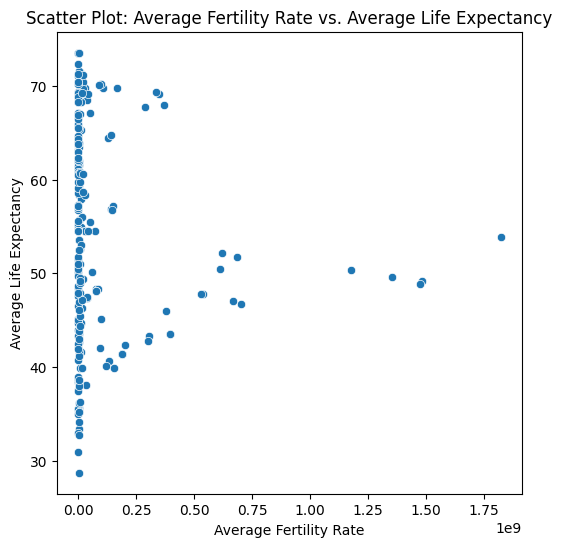

In [15]:
plt.figure(figsize=(6, 6))
sns.scatterplot(x='Average Fertility Rate', y='Average Life Expectancy', data=average_df)
plt.title('Scatter Plot: Average Fertility Rate vs. Average Life Expectancy')
plt.xlabel('Average Fertility Rate')
plt.ylabel('Average Life Expectancy')
plt.show()

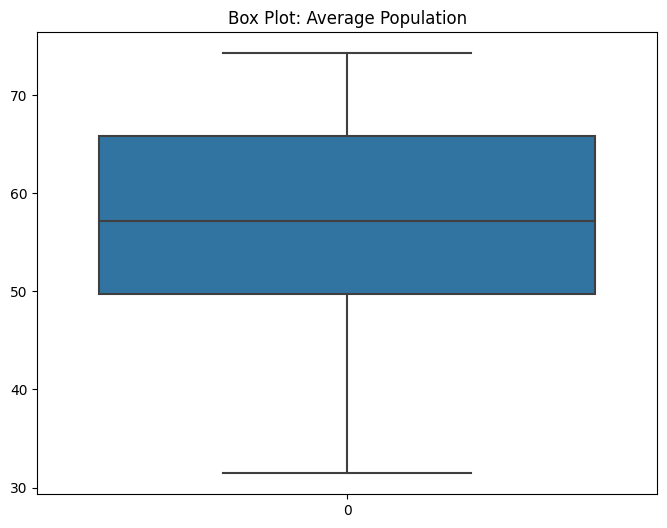

In [16]:
plt.figure(figsize=(8, 6))
sns.boxplot(average_df['Average Population'])
plt.title('Box Plot: Average Population')
plt.show()

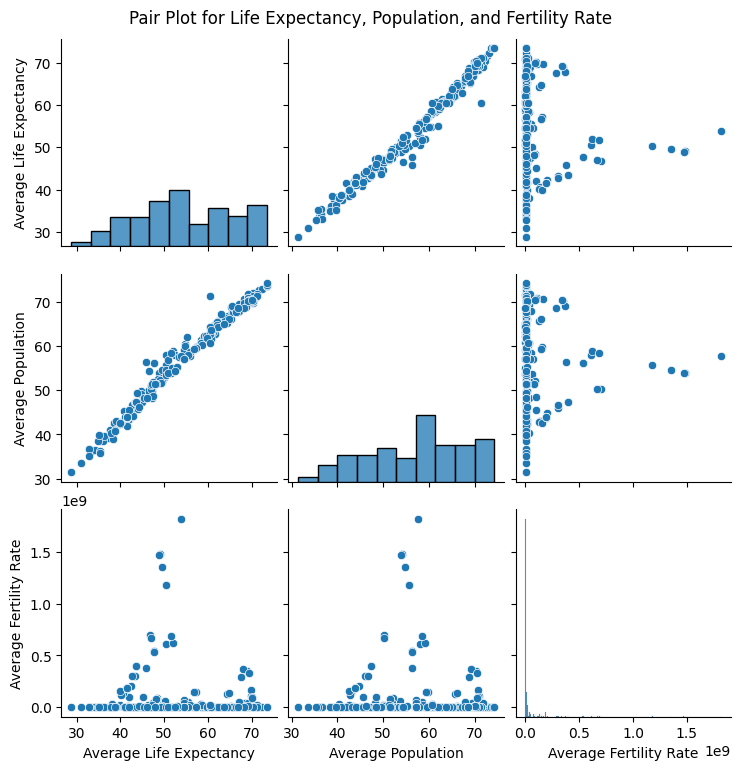

In [17]:
sns.pairplot(average_df[['Average Life Expectancy', 'Average Population', 'Average Fertility Rate']])
plt.suptitle('Pair Plot for Life Expectancy, Population, and Fertility Rate', y=1.02)
plt.show()

In [18]:
correlation_matrix =average_df[['Average Life Expectancy', 'Average Population', 'Average Fertility Rate']].corr()
print(correlation_matrix)

                         Average Life Expectancy  Average Population  \
Average Life Expectancy                 1.000000            0.989981   
Average Population                      0.989981            1.000000   
Average Fertility Rate                 -0.095139           -0.048934   

                         Average Fertility Rate  
Average Life Expectancy               -0.095139  
Average Population                    -0.048934  
Average Fertility Rate                 1.000000  


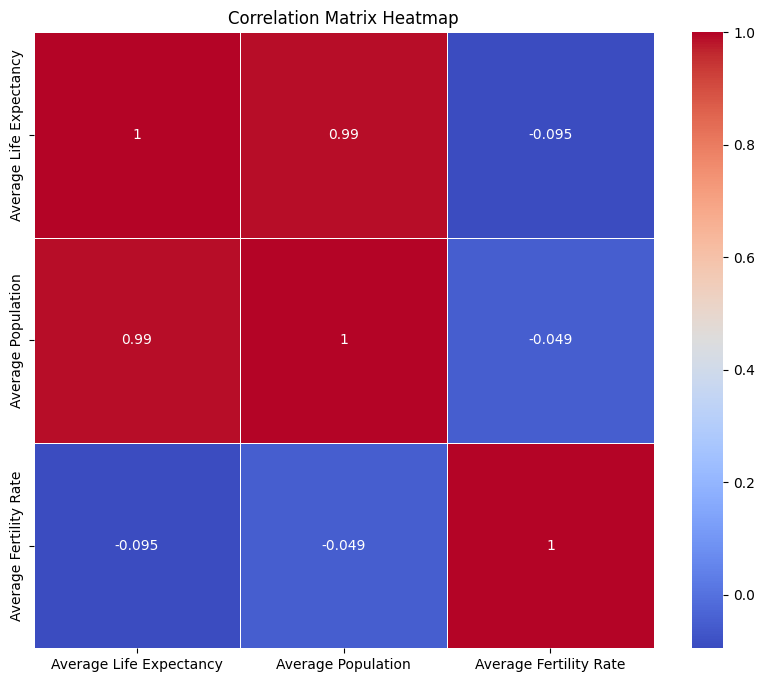

In [19]:
plt.figure(figsize=(10, 8))
correlation_matrix = average_df[['Average Life Expectancy', 'Average Population', 'Average Fertility Rate']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [25]:
country.shape

(263, 4)

In [21]:
country.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 263 entries, 0 to 262
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Country Code  263 non-null    object 
 1   Region        217 non-null    object 
 2   IncomeGroup   217 non-null    object 
 3   SpecialNotes  147 non-null    object 
 4   TableName     263 non-null    object 
 5   Unnamed: 5    0 non-null      float64
dtypes: float64(1), object(5)
memory usage: 12.5+ KB


In [24]:
country.isna().sum()

Country Code     0
Region          46
IncomeGroup     46
TableName        0
dtype: int64

In [23]:
country.drop(['SpecialNotes','Unnamed: 5'],axis = 1, inplace = True)

In [47]:
country

,Country Code,Region,IncomeGroup,TableName
0,ABW,Latin America & Caribbean,High income,Aruba
1,AFG,South Asia,Low income,Afghanistan
2,AGO,Sub-Saharan Africa,Lower middle income,Angola
3,ALB,Europe & Central Asia,Upper middle income,Albania
4,AND,Europe & Central Asia,High income,Andorra
...,...,...,...,...
258,XKX,Europe & Central Asia,Lower middle income,Kosovo
259,YEM,Middle East & North Africa,Lower middle income,"Yemen, Rep."
260,ZAF,Sub-Saharan Africa,Upper middle income,South Africa
261,ZMB,Sub-Saharan Africa,Lower middle income,Zambia


In [48]:
region_values=country['Region'].unique()
income_values=country['IncomeGroup'].unique()

In [51]:
country.isnull().sum()

Country Code     0
Region          39
IncomeGroup     42
TableName        0
dtype: int64

In [50]:
for value in income_values:
    mask = (country['TableName'] == value) & pd.isna(country['IncomeGroup'])
    country.loc[mask, 'IncomeGroup'] = value
    
for value in region_values:
    mask= (country['TableName'] == value) & pd.isna(country['Region'])
    country.loc[mask, 'Region'] = value

In [52]:
country=country.dropna(subset=['Region'])

In [54]:
country.isnull().sum()

Country Code    0
Region          0
IncomeGroup     7
TableName       0
dtype: int64

In [55]:
country=country.dropna(subset=['IncomeGroup'])

In [56]:
country.isnull().sum()

Country Code    0
Region          0
IncomeGroup     0
TableName       0
dtype: int64

In [57]:
country.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 217 entries, 0 to 262
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Country Code  217 non-null    object
 1   Region        217 non-null    object
 2   IncomeGroup   217 non-null    object
 3   TableName     217 non-null    object
dtypes: object(4)
memory usage: 8.5+ KB


In [58]:
country

,Country Code,Region,IncomeGroup,TableName
0,ABW,Latin America & Caribbean,High income,Aruba
1,AFG,South Asia,Low income,Afghanistan
2,AGO,Sub-Saharan Africa,Lower middle income,Angola
3,ALB,Europe & Central Asia,Upper middle income,Albania
4,AND,Europe & Central Asia,High income,Andorra
...,...,...,...,...
258,XKX,Europe & Central Asia,Lower middle income,Kosovo
259,YEM,Middle East & North Africa,Lower middle income,"Yemen, Rep."
260,ZAF,Sub-Saharan Africa,Upper middle income,South Africa
261,ZMB,Sub-Saharan Africa,Lower middle income,Zambia


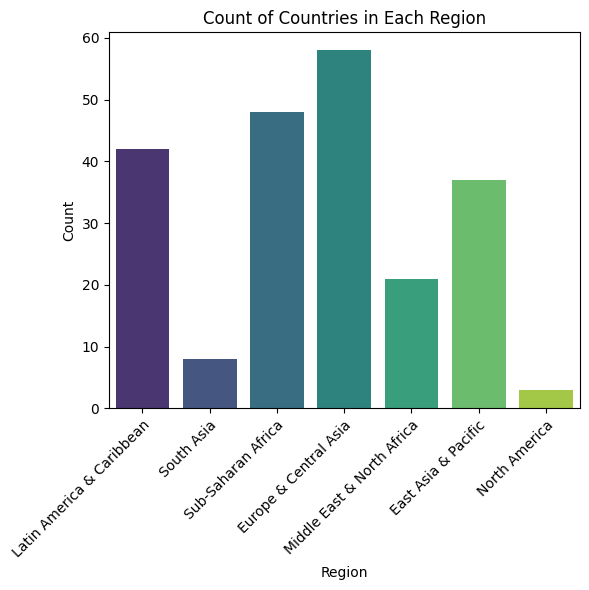

In [59]:
plt.figure(figsize=(6, 6))
sns.countplot(data=country, x='Region', palette='viridis')
plt.xticks(rotation=45, ha='right', rotation_mode='anchor', fontsize=10)
plt.title('Count of Countries in Each Region')
plt.xlabel('Region')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

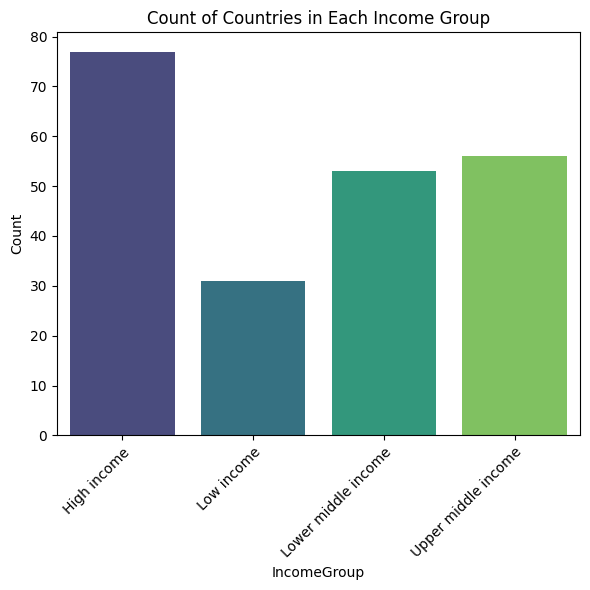

In [60]:
plt.figure(figsize=(6, 6))
sns.countplot(data=country, x='IncomeGroup', palette='viridis')
plt.xticks(rotation=45, ha='right', rotation_mode='anchor', fontsize=10)
plt.title('Count of Countries in Each Income Group')
plt.xlabel('IncomeGroup')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

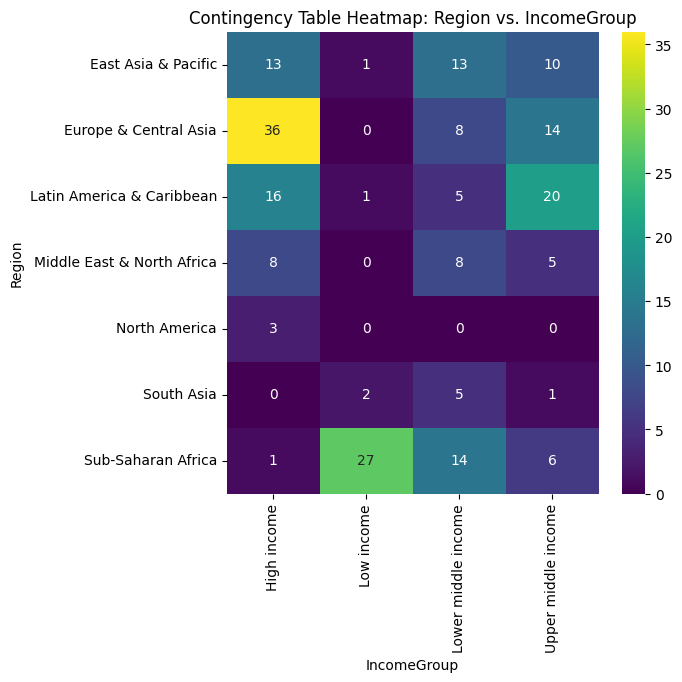

In [61]:
plt.figure(figsize=(6, 6))
contingency_table = pd.crosstab(country['Region'], country['IncomeGroup'])
sns.heatmap(contingency_table, annot=True, cmap='viridis', fmt='d')
plt.title('Contingency Table Heatmap: Region vs. IncomeGroup')
plt.show()

In [62]:
years = [str(i) for i in range(1960,2017)]
df=pd.melt(population,id_vars='Country Code',value_vars=years,var_name='Year',value_name="Population")
df_merged = pd.merge(country,df,how='left',on='Country Code')

In [63]:
test=pd.melt(fertility,id_vars='Country Code',value_vars=years,var_name='Year',value_name="Fertility rate")
test

,Country Code,Year,Fertility rate
0,ABW,1960,4.820000
1,AFG,1960,7.450000
2,AGO,1960,7.478000
3,ALB,1960,6.489000
4,AND,1960,5.508217
...,...,...,...
15043,XKX,2016,2.060000
15044,YEM,2016,3.995000
15045,ZAF,2016,2.458000
15046,ZMB,2016,4.981000


In [64]:
finaling_test=pd.merge(test,df_merged,how='left',on=['Country Code','Year'])

In [65]:
finaling_test

,Country Code,Year,Fertility rate,Region,IncomeGroup,TableName,Population
0,ABW,1960,4.820000,Latin America & Caribbean,High income,Aruba,54211.0
1,AFG,1960,7.450000,South Asia,Low income,Afghanistan,8996351.0
2,AGO,1960,7.478000,Sub-Saharan Africa,Lower middle income,Angola,5643182.0
3,ALB,1960,6.489000,Europe & Central Asia,Upper middle income,Albania,1608800.0
4,AND,1960,5.508217,Europe & Central Asia,High income,Andorra,13411.0
...,...,...,...,...,...,...,...
15043,XKX,2016,2.060000,Europe & Central Asia,Lower middle income,Kosovo,1816200.0
15044,YEM,2016,3.995000,Middle East & North Africa,Lower middle income,"Yemen, Rep.",27584213.0
15045,ZAF,2016,2.458000,Sub-Saharan Africa,Upper middle income,South Africa,56015473.0
15046,ZMB,2016,4.981000,Sub-Saharan Africa,Lower middle income,Zambia,16591390.0


In [66]:
test1=pd.melt(life_expectency,id_vars='Country Code',value_vars=years,var_name='Year',value_name="Life Expectancy")

In [67]:
final_df=pd.merge(test1,finaling_test,how='left',on=['Country Code','Year'])

In [68]:
final_df

,Country Code,Year,Life Expectancy,Fertility rate,Region,IncomeGroup,TableName,Population
0,ABW,1960,65.662000,4.820000,Latin America & Caribbean,High income,Aruba,54211.0
1,AFG,1960,32.292000,7.450000,South Asia,Low income,Afghanistan,8996351.0
2,AGO,1960,33.251000,7.478000,Sub-Saharan Africa,Lower middle income,Angola,5643182.0
3,ALB,1960,62.279000,6.489000,Europe & Central Asia,Upper middle income,Albania,1608800.0
4,AND,1960,53.367005,5.508217,Europe & Central Asia,High income,Andorra,13411.0
...,...,...,...,...,...,...,...,...
15043,XKX,2016,71.646341,2.060000,Europe & Central Asia,Lower middle income,Kosovo,1816200.0
15044,YEM,2016,64.953000,3.995000,Middle East & North Africa,Lower middle income,"Yemen, Rep.",27584213.0
15045,ZAF,2016,62.774000,2.458000,Sub-Saharan Africa,Upper middle income,South Africa,56015473.0
15046,ZMB,2016,61.874000,4.981000,Sub-Saharan Africa,Lower middle income,Zambia,16591390.0


In [69]:
country_info = population[['Country Code', 'Country Name']]

In [70]:
final_df = pd.merge(final_df, country_info, on='Country Code', how='left')

In [71]:
column_order = ['Country Code', 'Country Name', 'Region', 'IncomeGroup', 'Year', 'Population', 'Life Expectancy', 'Fertility rate', 'TableName']
dataset= final_df[column_order]

In [72]:
dataset

,Country Code,Country Name,Region,IncomeGroup,Year,Population,Life Expectancy,Fertility rate,TableName
0,ABW,Aruba,Latin America & Caribbean,High income,1960,54211.0,65.662000,4.820000,Aruba
1,AFG,Afghanistan,South Asia,Low income,1960,8996351.0,32.292000,7.450000,Afghanistan
2,AGO,Angola,Sub-Saharan Africa,Lower middle income,1960,5643182.0,33.251000,7.478000,Angola
3,ALB,Albania,Europe & Central Asia,Upper middle income,1960,1608800.0,62.279000,6.489000,Albania
4,AND,Andorra,Europe & Central Asia,High income,1960,13411.0,53.367005,5.508217,Andorra
...,...,...,...,...,...,...,...,...,...
15043,XKX,Kosovo,Europe & Central Asia,Lower middle income,2016,1816200.0,71.646341,2.060000,Kosovo
15044,YEM,"Yemen, Rep.",Middle East & North Africa,Lower middle income,2016,27584213.0,64.953000,3.995000,"Yemen, Rep."
15045,ZAF,South Africa,Sub-Saharan Africa,Upper middle income,2016,56015473.0,62.774000,2.458000,South Africa
15046,ZMB,Zambia,Sub-Saharan Africa,Lower middle income,2016,16591390.0,61.874000,4.981000,Zambia


[Text(0.5, 1.0, 'Population Distribution')]

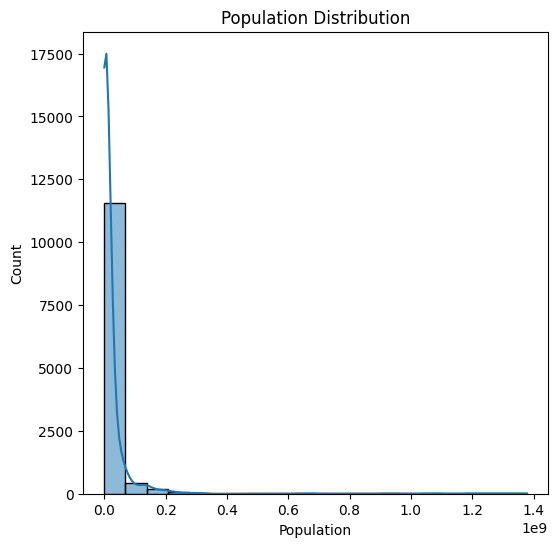

In [75]:
plt.figure(figsize=(6,6))
sns.histplot(dataset['Population'], bins=20, kde=True).set(title='Population Distribution')

[Text(0.5, 1.0, 'Life Expectancy Distribution')]

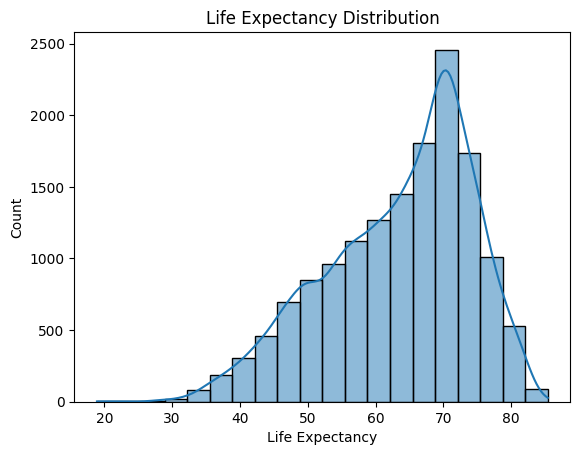

In [76]:
sns.histplot(dataset['Life Expectancy'], bins=20, kde=True).set(title='Life Expectancy Distribution')

[Text(0.5, 1.0, 'Fertility Rate Distribution')]

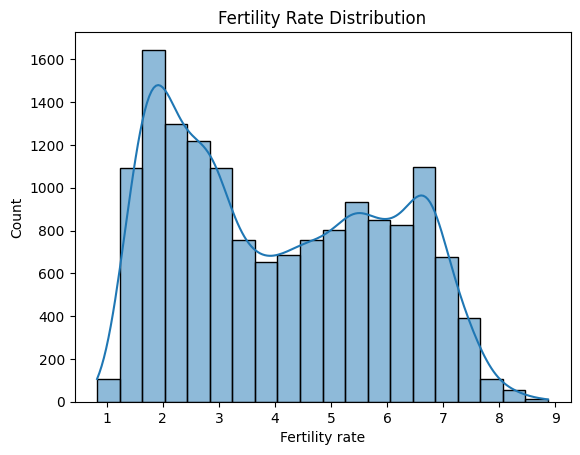

In [77]:
sns.histplot(dataset['Fertility rate'], bins=20, kde=True).set(title='Fertility Rate Distribution')

C:\Users\Asus\AppData\Local\Temp\ipykernel_4056\3256130047.py:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, 2)


[Text(0.5, 1.0, 'Fertility Rate by Region')]

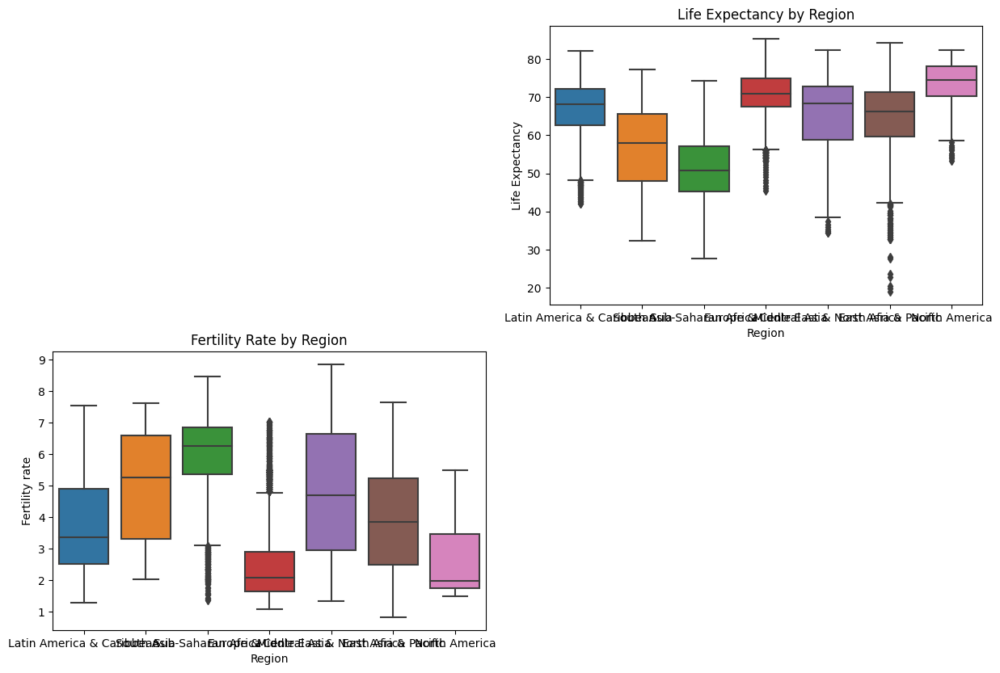

In [85]:
plt.figure(figsize=(12, 8))
sns.boxplot(x='Region', y='Population', data=dataset).set(title='Population by Region')

plt.subplot(2, 2, 2)
sns.boxplot(x='Region', y='Life Expectancy', data=dataset).set(title='Life Expectancy by Region')
plt.tight_layout()
plt.subplot(2, 2, 3)
sns.boxplot(x='Region', y='Fertility rate', data=dataset).set(title='Fertility Rate by Region')

[Text(0.5, 1.0, 'Correlation Matrix Heatmap')]

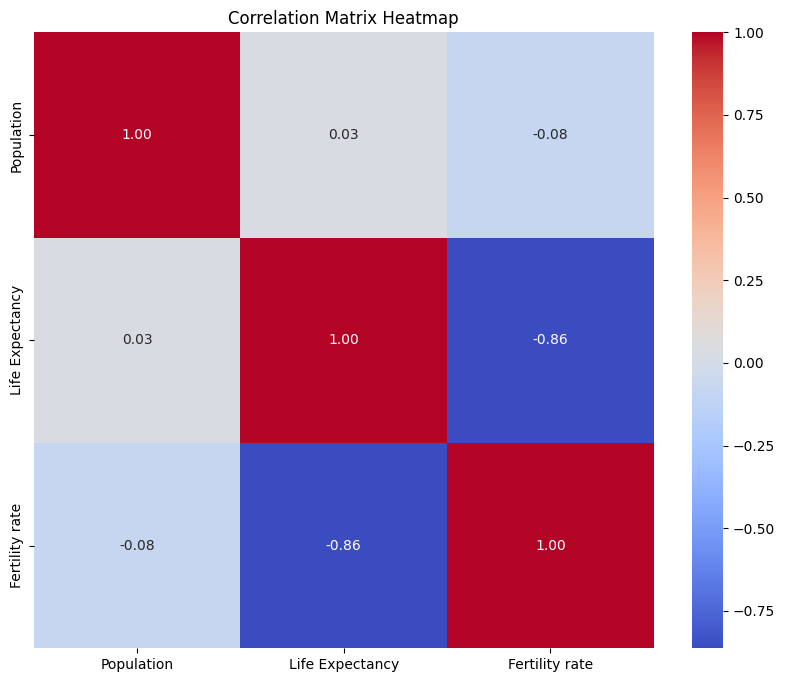

In [79]:
correlation_matrix = dataset[['Population', 'Life Expectancy', 'Fertility rate']].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f').set(title='Correlation Matrix Heatmap')

C:\Users\Asus\AppData\Local\Temp\ipykernel_4056\4021976769.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Region', y='Life Expectancy', data=dataset, ci=None).set(title='Average Life Expectancy by Region')
C:\Users\Asus\AppData\Local\Temp\ipykernel_4056\4021976769.py:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Region', y='Fertility rate', data=dataset, ci=None).set(title='Average Fertility Rate by Region')
C:\Users\Asus\AppData\Local\Temp\ipykernel_4056\4021976769.py:9: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Region', y='Population', data=dataset, ci=None).set(title='Average Population by Region')


[Text(0.5, 1.0, 'Average Population by Region')]

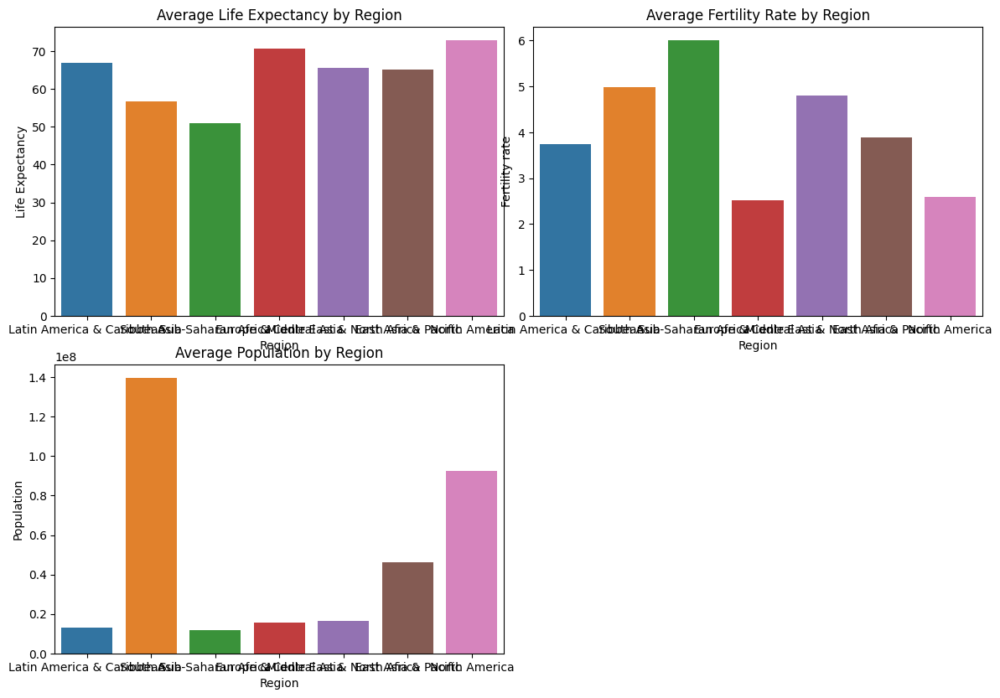

In [92]:
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
sns.barplot(x='Region', y='Life Expectancy', data=dataset, ci=None).set(title='Average Life Expectancy by Region')
plt.tight_layout()
plt.subplot(2, 2, 2)
sns.barplot(x='Region', y='Fertility rate', data=dataset, ci=None).set(title='Average Fertility Rate by Region')

plt.subplot(2, 2, 3)
sns.barplot(x='Region', y='Population', data=dataset, ci=None).set(title='Average Population by Region')

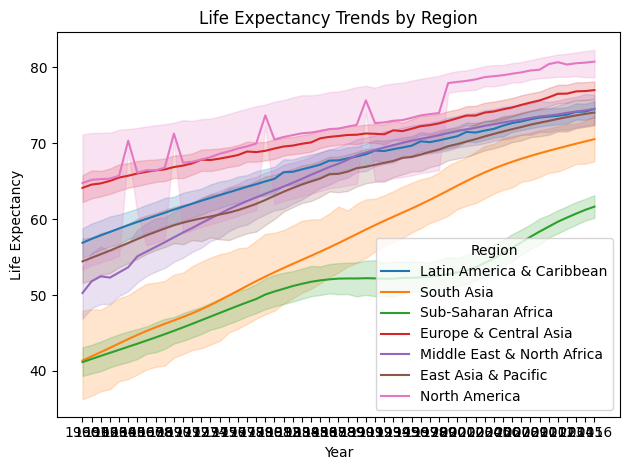

In [95]:
sns.lineplot(x='Year', y='Life Expectancy', hue='Region', data=dataset).set(title='Life Expectancy Trends by Region')
plt.tight_layout()

In [94]:
import plotly.express as px
fig = px.histogram(dataset, x='Population', title='Population Distribution')
fig.show()

In [97]:
fig = px.box(dataset, x='Region', y='Population', title='Population Box Plot by Region')
fig.show()


In [98]:
fig = px.histogram(dataset, x='Region', title='Count Plot by Region')
fig.show()


In [118]:
fig = px.histogram(dataset, x='Life Expectancy', title='Count Plot by Life Expectancy')
fig.show()


In [117]:
fig = px.histogram(dataset, x='Fertility rate', title='Count Plot by ertility rate')
fig.show()

In [105]:
fig = px.histogram(dataset, x='Region', title='Count Plot by Region')
fig.show()

In [116]:
fig = px.histogram(dataset, x='IncomeGroup', title='Count Plot by IncomeGroup')
fig.show()

In [115]:
fig = px.scatter(dataset, x='Population', y='Fertility rate', title='Population vs. Fertility rate')
fig.show()

In [114]:
fig = px.scatter(dataset, x='Fertility rate', y='Life Expectancy', title='Fertility rate vs. Life Expectancy')
fig.show()

In [120]:
fig = px.scatter_matrix(dataset[['Population', 'Life Expectancy', 'Fertility rate']], title='Pair Plot')
fig.show()

In [122]:
import plotly.figure_factory as ff

correlation_matrix = dataset[['Population', 'Life Expectancy', 'Fertility rate']].corr()
fig = ff.create_annotated_heatmap(z=correlation_matrix.values,
                                  x=list(correlation_matrix.columns),
                                  y=list(correlation_matrix.index),
                                  colorscale='Viridis')
fig.update_layout(title='Correlation Matrix Heatmap')
fig.show()


In [126]:
fig = px.parallel_coordinates(dataset, dimensions=['Population', 'Life Expectancy', 'Fertility rate'])
fig.show()
